# Auto-iterative self-training system for small crater detection

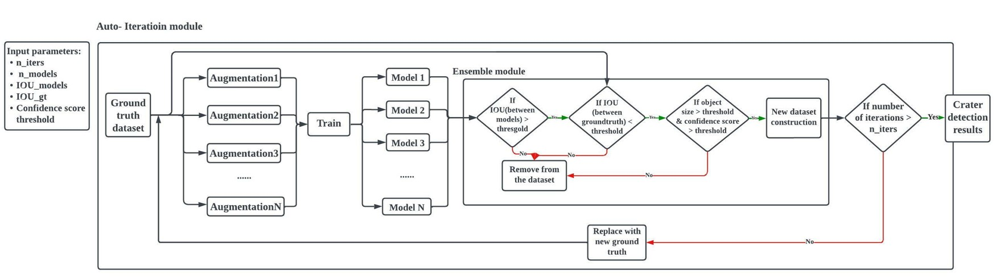

## Step1. Install requirements

In [1]:
%cd /content/drive/MyDrive/yolov5-1024

/content/drive/MyDrive/yolov5-1024


In [2]:

# !git clone https://github.com/ultralytics/yolov5  # clone repo

%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow


import pylab as plt
from pylab import *
import numpy as np
import pandas as pd
import os
import torch
import time
import yaml
import os
import random
from os import listdir
from PIL import Image as PImage
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
Image.MAX_IMAGE_PIXELS = None
import cv2
%matplotlib inline

from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 63.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.7/76.7 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.4 MB/s eta 0:00:00
Setup complete. Using torch 2.3.1+cu121 (Tesla T4)


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="ki0djCy1EbEHsXVDSkKj")
project = rf.workspace("crater").project("crater-brn84")
dataset = project.version(1).download("yolov5")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to crater-1 in yolov5pytorch:: 100%|██████████| 15725/15725 [01:41<00:00, 155.23it/s]


In [ ]:
%cd /content/drive/MyDrive/yolov5-1024
!python train.py --img 640 --batch 32 --epochs 100 --data /content/drive/MyDrive/yolov5-1024/upload_files/crater.yaml --weights yolov5s.pt --hyp data/hyps/hyp.scratch-low.yaml --cache

/content/drive/MyDrive/yolov5-1024
2024-04-22 15:42:31.129553: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-22 15:42:31.129600: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-22 15:42:31.130991: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/drive/MyDrive/yolov5-1024/upload_files/crater.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_

## Step2. Download the Dataset

The crater labeling in the groundtruth training set:


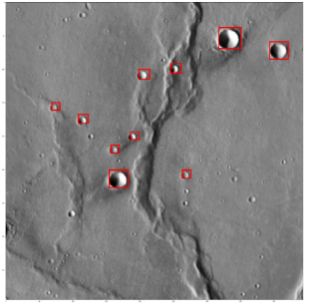

### Method 1
Download the training, validation and testing set from the Robotflow api (images without labels have been removed)

#### Training set

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Sf4KX5xghK43qDvdyOmX")
project = rf.workspace("imperial-college-london-52ovf").project("1024-plduh")
dataset = project.version(1).download("yolov5")



Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to 1024-1 in yolov5pytorch:: 100%|██████████| 3021/3021 [00:17<00:00, 172.87it/s]


#### Validation and testing set

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Sf4KX5xghK43qDvdyOmX")
project = rf.workspace("imperial-college-london-52ovf").project("test-vnt4k")
dataset = project.version(1).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to test-1 in yolov5pytorch:: 100%|██████████| 244/244 [00:01<00:00, 235.32it/s]


As long as the training, validation and testing dataset appears in the folder, dataset download completed! ✌

### Method 2 - optional

Use this method only if you want to download the dataset into your computer, access the following links:

Training set https://drive.google.com/drive/folders/1kGhdqgWm4_tWLcYHgkFnLcN9yC7fJ7qY?usp=sharing

Validation set https://drive.google.com/drive/folders/1_cVloNvt5vPUDe5tciN0Js-9zTmBuWO0?usp=sharing

Testing set https://drive.google.com/drive/folders/1NVIQNLTZ97TBMlBSpqUYp-d2e20ZZw5V?usp=sharing

Otherwise, see method 2.

Run the file upload cell and choose the training, testing and validatioin set to upload into colab

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving upload_files-20230427T152331Z-001.zip to upload_files-20230427T152331Z-001.zip


Or mount your own google drive to upload your custom dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

## Step3. Upload the required files (ensemble module and data.yaml)

Download the files required using this link: https://drive.google.com/drive/folders/177_dOTySsoOBehovgjRHAoJrnJFAVU40?usp=sharing

Upload this file into colab

In [ ]:
from google.colab import files
uploaded = files.upload()

In [ ]:
name = str(uploaded.keys()).split('\'')[1]
!unzip {name}

Archive:  upload_files-20230427T152331Z-001.zip
  inflating: upload_files/rename.py  
  inflating: upload_files/ensemble.py  
  inflating: upload_files/crater.yaml  


Rename the files

In [ ]:
#Training set
!python /content/drive/MyDrive/yolov5_e/upload_files/rename.py --pathtxt /content/drive/MyDrive/yolov5-1024/crater_dataset_1024-2/train/labels --pathimg /content/drive/MyDrive/yolov5-1024/crater_dataset_1024-2/train/images
#Testing set
# !python /content/yolov5/upload_files/rename.py --pathtxt /content/drive/MyDrive/yolov5/try-1/valid/labels --pathimg /content/drive/MyDrive/yolov5/try-1/valid/images

# #Validation set
# !python /content/yolov5/upload_files/rename.py --pathtxt /content/yolov5/Validation_and_Testing-1/valid/labels --pathimg /content/yolov5/Validation_and_Testing-1/valid/images

In [ ]:

pathimg = '/content/drive/MyDrive/yolov5-1024/crater_dataset_1024-2/train/images'
pathtxt = '/content/drive/MyDrive/yolov5-1024/crater_dataset_1024-2/train/labels'

c = 0
txt_files = os.listdir(pathtxt)
img_files = os.listdir(pathimg)

V = 'valid'
Tr = 'train'
Ts = 'test'



for i in range(len(txt_files)):
#     os.chdir(pathtxt)
#     dot = txt_files[i].split(".")[0]
#     txtname = dot.split("_")[0]
#     os.rename(txt_files[i],txtname+'.txt')
#     # print(dot[:-3])


#     dot1 = img_files[i].split(".")[0]
#     imgname = dot1.split("_")[0]
#     os.chdir(pathimg)
#     os.rename(img_files[i],imgname+'.jpg')
# #     # c+=1

    os.chdir(pathtxt)
    txtname = 'crater'+str(c)+'.txt'
    os.rename(txt_files[i],txtname)
    # print(txtname)


    # dot1 = img_files[i].split(".")[0]
    imgname = 'crater'+str(c)+'.jpg'
    os.chdir(pathimg)
    os.rename(img_files[i],imgname)
    c+=1
# # print('rename completed! :)')

## Step4. Run the Self-training system

*** Please comment line 202 'asserion error' in train.py** otherwise it could not work

In [ ]:
import os
import yaml
def set_hyp(state):
    file_name = "/content/drive/MyDrive/yolov5-1024/data/hyps/hyp.scratch-low.yaml"
    with open(file_name) as f:
        doc = yaml.safe_load(f)

    doc['hsv_s'] = (1-state)/1.5
    doc['hsv_v'] = state
    doc['scale'] = state
    doc['shear'] = state/2

    with open(file_name, 'w') as f:
        yaml.safe_dump(doc, f, default_flow_style=False)
    print('hyper',doc)

def set_gt(pathgt):
  file_name = "/content/drive/MyDrive/yolov5-1024/upload_files/crater.yaml"
  with open(file_name) as f:
      doc = yaml.safe_load(f)

  doc['train'] = pathgt

  with open(file_name, 'w') as f:
      yaml.safe_dump(doc, f, default_flow_style=None)

  print(doc)

In [ ]:
import os
os.getcwd()

'/content/drive/MyDrive/yolov5-1024'

In [ ]:
# Setting input parameters
n_models = 1
n_iterations = 1

In [ ]:
#Run
%cd /content/drive/MyDrive/yolov5-1024
counter = 2
counter_ensemble = 1
script_path = os.path.realpath('/content/drive/MyDrive/yolov5-1024')
new_abs_path = os.path.join(script_path, 'ensemble_results1')
if os.path.exists(new_abs_path):
  pass
else:
  os.mkdir(new_abs_path)

for j in range(n_iterations):

    pathtxt = []
    if j == 0:
      pathgt_train = '/content/drive/MyDrive/yolov5-1024/crater_dataset_1024-2/train/images'
      pathgt = '/content/drive/MyDrive/yolov5-1024/crater_dataset_1024-2/train/labels'
    else:
      pathgt_train = '/content/drive/MyDrive/yolov5-1024/ensemble_results1/loop'+str(counter_ensemble-1)+'/images'
      pathgt = '/content/drive/MyDrive/yolov5-1024/ensemble_results1/loop'+str(counter_ensemble-1)+'/labels'
    for i in range(n_models):
      state = random.uniform(0,0.5)
      set_gt(pathgt_train)
      set_hyp(state)
      !python train.py --img 1024 --batch 16 --epochs 50 --data /content/drive/MyDrive/yolov5-1024/upload_files/crater.yaml --weights yolov5s.pt --hyp data/hyps/hyp.scratch-low.yaml --cache


      with open('detect.sh','w') as f:
        f.write('python detect.py --weights runs/train/exp'+str(counter)+'/weights/best.pt --img 1024 --conf 0.2 --source /content/drive/MyDrive/yolov5-1024/1024-1/train/images --save-txt --save-conf')
      !sh detect.sh
      pathtxt.append('./runs/detect/exp'+str(counter)+'/labels/crater')
      counter += 1

  # time.sleep(20)

    loop_path = os.path.join(new_abs_path, 'loop'+str(counter_ensemble))
    os.mkdir(loop_path)
    label_path = os.path.join(loop_path, 'labels')
    if os.path.exists(label_path):
      pass
    else:
      os.mkdir(label_path)
      with open('ln.sh','w') as f:
        f.write('ln -s  /content/drive/MyDrive/yolov5-1024/crater_dataset_1024-2/train/images /content/drive/MyDrive/yolov5-1024/ensemble_results1/loop'+str(counter_ensemble))
      !sh ln.sh

      pathsave = label_path
      pathimg = '/content/drive/MyDrive/yolov5-1024/crater_dataset_1024-2/train/images'
      !python upload_files/ensemble.py --gt {pathgt} --nargs {pathtxt} --pathimg {pathimg} --n_models {n_models}  --pathsave {pathsave}
      counter_ensemble+=1

      print('start '+str(counter_ensemble)+' iteration')


/content/drive/MyDrive/yolov5-1024


ScannerError: mapping values are not allowed here
  in "/content/drive/MyDrive/yolov5-1024/upload_files/crater.yaml", line 3, column 3

Standard self training

In [ ]:
#Run
counter = 2
counter_ensemble = 1
# Setting input parameters
n_models = 4
n_iterations = 3

for j in range(n_iterations):

    pathtxt = []
    if j == 0:
      pathgt_train = '/content/drive/MyDrive/yolov5_e/THEMIS_DATA-6/train/images'
      pathgt = '/content/drive/MyDrive/yolov5_e/THEMIS_DATA-6/train/labels'
    else:
      pathgt_train = '/content/drive/MyDrive/yolov5_e/runs/detect/exp'+str(counter)+'/images'
      pathgt = '/content/drive/MyDrive/yolov5_e/runs/detect/exp'+str(counter)+'/labels'

      !python train.py --img 416 --batch 16 --epochs 1 --data /content/drive/MyDrive/yolov5_e/upload_files/crater.yaml --weights yolov5s.pt --hyp data/hyps/hyp.scratch-low.yaml --cache


      with open('detect.sh','w') as f:
        f.write('python detect.py --weights runs/train/exp'+str(counter)+'/weights/best.pt --img 416 --conf 0.2 --source /content/drive/MyDrive/yolov5_e/THEMIS_DATA-6/train/images --save-txt --save-conf')
      !sh detect.sh
      pathtxt.append('./runs/detect/exp'+str(counter)+'/labels/crater')
      counter += 1


      with open('ln.sh','w') as f:
        f.write('ln -s /content/drive/MyDrive/yolov5_e/THEMIS_DATA-6/train/images /content/drive/MyDrive/yolov5_e/runs/detect/exp'+str(counter))
      !sh ln.sh

      print('start '+str(counter_ensemble)+' iteration')


train: weights=yolov5s.pt, cfg=, data=/content/drive/MyDrive/yolov5_e/upload_files/crater.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=1, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
Command 'git fetch origin' timed out after 5 seconds
requirements: protobuf<=3.20.1 not found and is required by YOLOv5, attempting auto-update...
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.12.0 requires protobuf!=4.21.0,!=4.

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Sf4KX5xghK43qDvdyOmX")
project = rf.workspace("imperial-college-london-52ovf").project("classify_iapygia")
dataset = project.version(1).download("yolov5")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to classify_iapygia-1 in yolov5pytorch:: 100%|██████████| 5108/5108 [00:25<00:00, 197.50it/s]


In [ ]:
%cd /content/drive/MyDrive/yolov5-1024
!python train.py --img 416 --batch 16 --epochs 50 --data /content/drive/MyDrive/yolov5_e/upload_files/crater.yaml --weights yolov5s.pt --hyp data/hyps/hyp.scratch-low.yaml --cache

/content/drive/MyDrive/yolov5-1024
2024-01-12 01:15:38.245153: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-12 01:15:38.245211: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-12 01:15:38.246645: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/drive/MyDrive/yolov5_e/upload_files/crater.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scal

## Results visualization

In [ ]:
def label_rescale(array,img_size):
    """
    Convert the label from YOLO format into pixel coordinates
    Returns the X, Y, W, H in pixel coordinates

    Parameters
    ___________
    param:array: array loaded from the yolo label text file
    param:img_size: shape of the image
    return:list of x,y,w,h for all craters

    Example
    ________
    >>>x,y,w,h,txt = convert_label(array,img.size)

    """

    l = len(array)
    x = []
    y = []
    w = []
    h = []
    txt = []
    if array.size == 6:
        x.append(array[1]*img.size[0])
        y.append(array[2]*img.size[0])
        w.append(array[3]*img.size[0])
        h.append(array[4]*img.size[0])
    else:
        for i in range(l):
            for j in range(4):
                if j == 0 or j == 2:
                    txt.append(array[i][j+1]*img.size[1])
                elif j == 1 or j == 3:
                    txt.append(array[i][j+1]*img.size[0])
        txt = np.reshape(txt, (l,4))
        for i in range(l):
            x.append(txt[i][0])
            y.append(txt[i][1])
            w.append(txt[i][2])
            h.append(txt[i][3])

    return x,y,w,h,txt

In [10]:
# Change the path and index of image you want to visualize
# ind = 30
# ind = 20
ind = 16 # 1
pathimg = "/content/drive/MyDrive/yolov5_e/THEMIS_DATA-6/train/images/crater"+str(ind)+".jpg"
pathtxt = "/content/drive/MyDrive/yolov5_e/ensemble_results_3model/loop7/labels/crater"+str(ind)+".txt"
pathtxtgt = "/content/drive/MyDrive/yolov5_e/THEMIS_DATA-6/train/labels/crater"+str(ind)+".txt"

img = PImage.open(pathimg)
img_size = img.size
array = np.loadtxt(pathtxt,dtype=float)
arraygt = np.loadtxt(pathtxtgt,dtype = float)

l = len(array)
lgt = len(arraygt)

x,y,w,h,txt = label_rescale(array,img_size)
xgt,ygt,wgt,hgt,txtgt = label_rescale(arraygt,img_size)
print('length of detection: ',l)
print('length of ground truth: ',lgt)



length of detection:  2
length of ground truth:  4


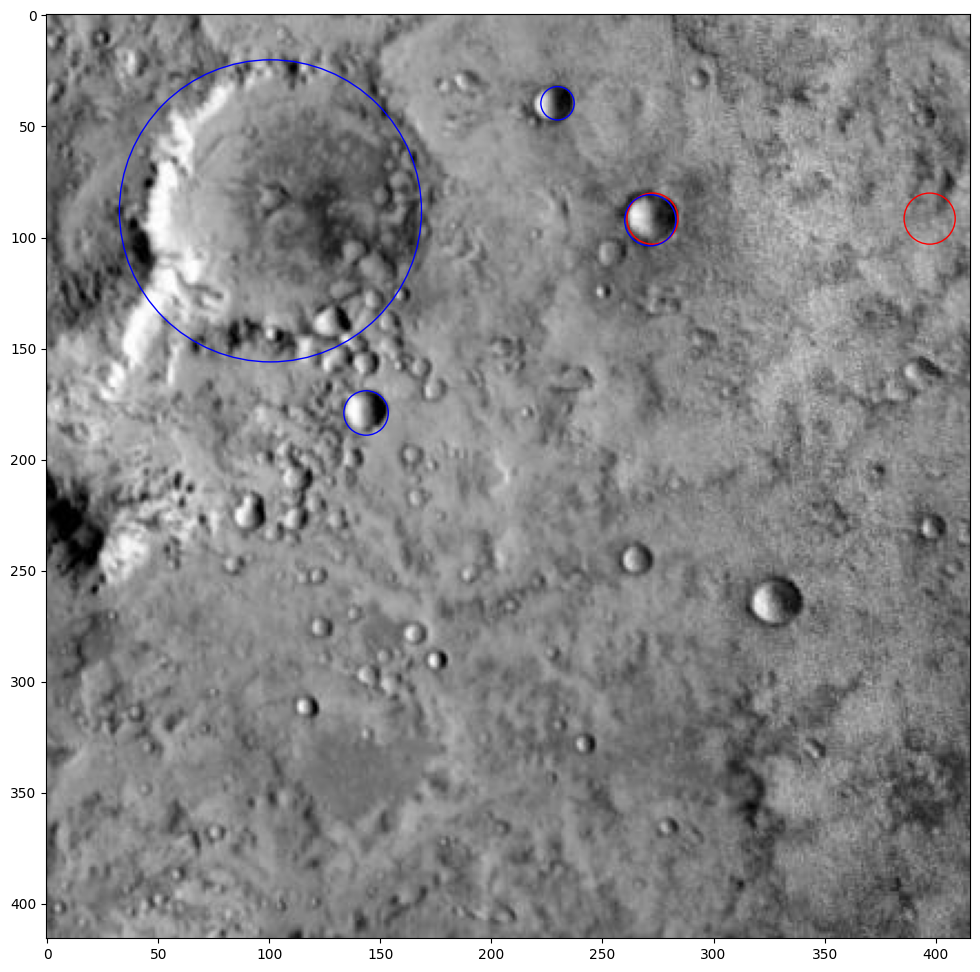

In [11]:
fig, axes = plt.subplots(ncols=1, figsize = (15,12))
plt.imshow(img,cmap='gray')
#ensemble
if len(x) == 1:
    crater = Circle((x[0], y[0]), w[0]/2 ,color='r', ec='r', alpha=1 ,linewidth = 1, fill = False)
    axes.add_patch(crater)
else:
    for i in range(l):
        # crater = Rectangle((x[i]-w[i]/2, y[i]-h[i]/2), w[i], h[i] ,color='r', ec='r', alpha=1 ,linewidth = 3, fill = False)
        crater = Circle((x[i], y[i]), w[i]/2 ,color='r', ec='r', alpha=1 ,linewidth = 1, fill = False)
        axes.add_patch(crater)
if len(xgt) == 1:
    crater = Circle((xgt[0], ygt[0]), wgt[0]/2 ,color='b', ec='b', alpha=1 ,linewidth = 1, fill = False)
    axes.add_patch(crater)
else:
    for i in range(lgt):
        # crater = Rectangle((xgt[i]-wgt[i]/2, ygt[i]-hgt[i]/2), wgt[i], hgt[i] ,color='y', ec='y', alpha=1 ,linewidth = 3, fill = False)
        # axes.add_patch(crater)
        crater = Circle((xgt[i], ygt[i]), wgt[i]/2 ,color='b', ec='b', alpha=1 ,linewidth = 1, fill = False)
        axes.add_patch(crater)


#### Visualization of Ground truth

In [3]:
def compute_IOU(rec1,rec2):
    """
    :param rec1: (x0,y0,x1,y1)
    :param rec2: (x0,y0,x1,y1)
    :return: IOU.
    """
    left_column_max  = max(rec1[0],rec2[0])
    right_column_min = min(rec1[2],rec2[2])
    up_row_max       = max(rec1[1],rec2[1])
    down_row_min     = min(rec1[3],rec2[3])

    if left_column_max>=right_column_min or down_row_min<=up_row_max:
        return 0

    else:
        S1 = (rec1[2]-rec1[0])*(rec1[3]-rec1[1])
        S2 = (rec2[2]-rec2[0])*(rec2[3]-rec2[1])
        S_cross = (down_row_min-up_row_max)*(right_column_min-left_column_max)
        return S_cross/(S1+S2-S_cross)

def label_rescale(array,img_size):
    l = len(array)

    x = []
    y = []
    w = []
    h = []
    txt = []
    if array.size == 5 or array.size == 6:
        x.append(array[1]*img_size[0])
        y.append(array[2]*img_size[0])
        w.append(array[3]*img_size[0])
        h.append(array[4]*img_size[0])
        txt = [x,y,w,h]
        txt = np.reshape(txt,(1,4))
#         print('txt',txt)
    else:
        for i in range(l):
            for j in range(4):
                if j == 0 or j == 2:
                    txt.append(array[i][j+1]*img_size[1])
                elif j == 1 or j == 3:
                    txt.append(array[i][j+1]*img_size[0])
        txt = np.reshape(txt, (l,4))
        for i in range(l):
            x.append(txt[i][0])
            y.append(txt[i][1])
            w.append(txt[i][2])
            h.append(txt[i][3])

    return x,y,w,h,txt

def iou_label_convert(l,txt):
    txt_iou = txt.copy()
    if txt.size == 4:
        txt_iou[0][2] = txt[0][2]+txt[0][0]
        txt_iou[0][3] = txt[0][3]+txt[0][1]
    else:
        for i in range(l):
            txt_iou[i][2] = txt[i][2]+txt[i][0]
            txt_iou[i][3] = txt[i][3]+txt[i][1]

    return txt_iou

def size_array(array):
    if array.size == 5:
        l = 1
    else:
        l = len(array)

    return l

def yolo_labels_convert(labels,img_size):
    labels_conv = []
    for i in range(len(labels)):
        for j in range(4):
            if j == 0 or j == 2:
                labels_conv.append(labels[i][j]/img_size[1])
            elif j == 1 or j == 3:
                labels_conv.append(labels[i][j]/img_size[0])

    labels_conv = np.reshape(labels_conv, (len(labels),4))
    return labels_conv

def savefile(labels_conv,counter2,pathsave,listlabel):
    path_save = pathsave+'/'+listlabel
    fileObject = open(path_save,'a')
    fileObject.truncate(0)
    for m in range(len(labels_conv)):
        list = []
        list = np.append(0,labels_conv[m])
        for ip in list:
            fileObject.write(str(ip))
            fileObject.write(' ')
        fileObject.write('\n')
    fileObject.close()


22 9


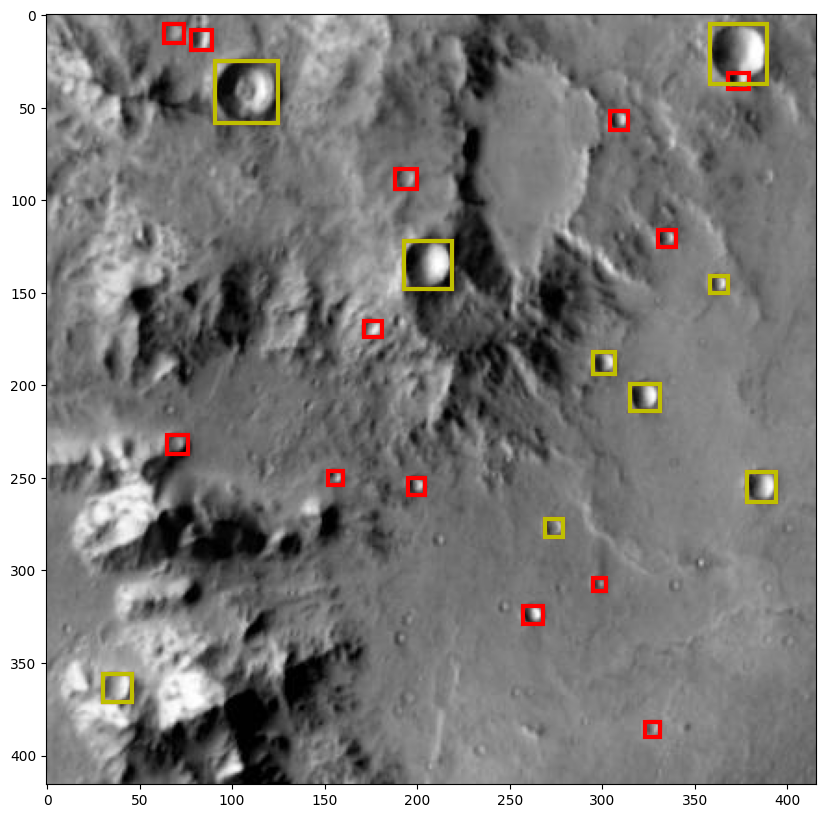

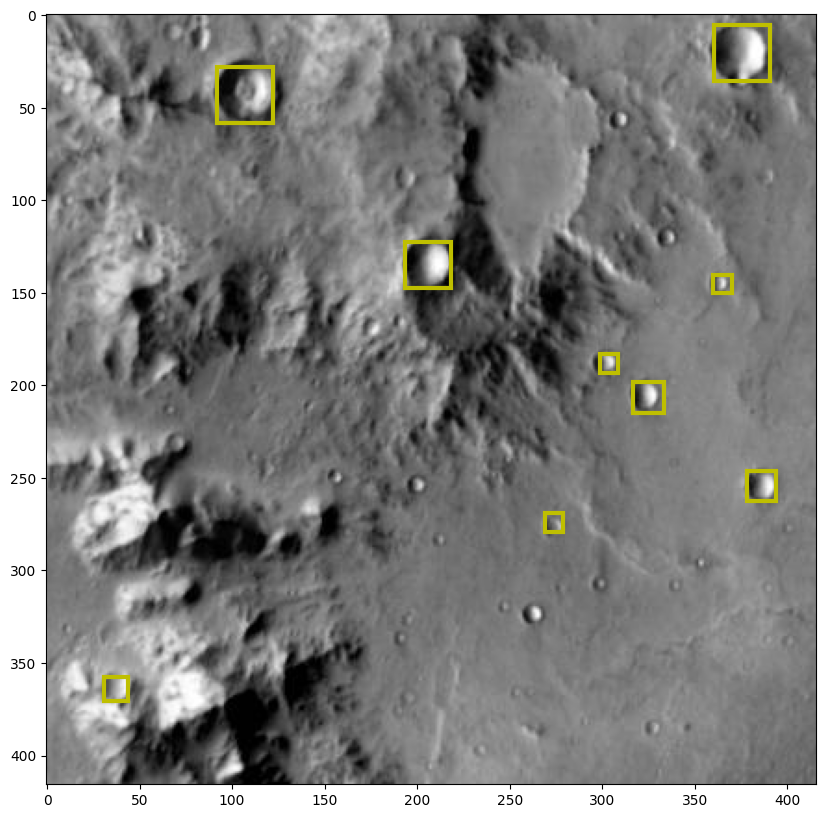

In [28]:
# k = 61
k = 1320 #overlap
# k = 228
# k = 1940 #SMALL
# k= 220 #large
pathimg = "/content/drive/MyDrive/yolov5_e/THEMIS_DATA-6/train/images/crater"+str(k)+".jpg"
pathtxt = "/content/drive/MyDrive/yolov5_e/ensemble_results_3model/loop7/labels/crater"+str(k)+".txt"
# pathtxt = "/content/drive/MyDrive/yolov5_e/ensemble_results_3model/loop9/labels/crater"+str(k)+".txt"
# pathtxt = "/content/drive/MyDrive/yolov5_e/ensemble_results_3model/loop9/labels/large/crater220.txt"
pathtxtgt = "/content/drive/MyDrive/yolov5_e/THEMIS_DATA-6/train/labels/crater"+str(k)+".txt"

pathname1 = pathtxtgt
pathname2 = pathtxt



if os.path.exists(pathname1):
#     print(os.path.exists(os.path.join(path1,pathname2[i])))
    txtnew = []
    counter1 = 0
    labels = []
    img = PImage.open(pathimg)

    img_size = [416,416]
    #***********************************GT***********************************
    array = np.loadtxt(pathname1,dtype = float)
    x,y,w,h,txt = label_rescale(array,img_size)

    l_gt = len(txt)
    l = size_array(array)

    txtgt = iou_label_convert(l,txt)

#         #***********************************model outcome***********************************|
    array1 = np.loadtxt(pathname2,dtype = float)

    if array1.size != 5:
        x1,y1,w1,h1,txt1 = label_rescale(array1,img_size)


    l1 = size_array(array1)
    txt1_iou = iou_label_convert(l1,txt1)

#         #**********************************IOU*********************************************
#         #IOU between model 1 and model 2
    labels = []
    txtnew = txt1
    counter1= 0

    if txt1.size == 4:
        signal = np.zeros(1)
        iou = compute_IOU(txt1_iou[0], txtgt[0])
        if iou >0.1:
            signal[counter1] = 1

    else:
        signal = np.zeros(l1)
        for i in range(l1):
            for j in range(l_gt):
                iou = compute_IOU(txt1_iou[i],  txtgt[j])
                if iou >0.45:
                    signal[counter1] = 1
            counter1 += 1

    for i in range(len(signal)):
        if signal[i] == 1:
            labels.append(txt1[i])


#         #**********convert the label back to yolo format******************
    labels = np.reshape(labels, (len(labels),4))
    labels_conv = yolo_labels_convert(labels,img_size)

    print(l1,l)

else:
    print('not exist')



fig, axes = plt.subplots(ncols=1, figsize = (20,10))
plt.imshow(img,cmap='gray')


if len(x1) == 1:
    crater = Circle((x1[0], y1[0]), w1[0]/2 ,color='r', ec='y', alpha=1 ,linewidth = 3, fill = False)
    axes.add_patch(crater)
else:
    for i in range(l1):
        crater = Rectangle((x1[i]-w1[i]/2, y1[i]-h1[i]/2), w1[i], h1[i] ,color='r', ec='r', alpha=1 ,linewidth = 3, fill = False)
        axes.add_patch(crater)

if labels.size== 4:
    crater = Rectangle((labels[0]-labels[2]/2, labels[1]-labels[3]/2), labels[2], labels[3],color='y', ec='y', alpha=1 ,linewidth = 3, fill = False)
    axes.add_patch(crater)
else:
    for i in range(len(labels)):
        crater = Rectangle((labels[i][0]-labels[i][2]/2, labels[i][1]-labels[i][3]/2), labels[i][2], labels[i][3] ,color='y', ec='y', alpha=1 ,linewidth = 3, fill = False)
        axes.add_patch(crater)


fig, axes = plt.subplots(ncols=1, figsize = (20,10))
plt.imshow(img,cmap='gray')


if len(x) == 1:
    crater = Rectangle((x[0]-w[0]/1.5, y[0]-h[0]/1.5), w[0],h[0] ,color='r', ec='y', alpha=1 ,linewidth = 3, fill = False)
    axes.add_patch(crater)
else:
    for i in range(l):
        crater = Rectangle((x[i]-w[i]/2, y[i]-h[i]/2), w[i], h[i] ,color='y', ec='y', alpha=1 ,linewidth = 3, fill = False)
        axes.add_patch(crater)

# Step5.Test

### Detect the test results from two models

In [ ]:
!python detect.py --weights /content/drive/MyDrive/yolov5_e/runs/train/exp4/weights/best.pt --img 416 --source /content/yolov5/Validation_and_Testing-1/test/images --save-txt --save-conf

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/exp16/weights/best.pt --img 416 --source /content/yolov5/Validation_and_Testing-1/test/images --save-txt --save-conf

## Run the ensemble module

In [ ]:
path1 = '/content/yolov5/runs/detect/exp20/labels/crater'
path2 = '/content/yolov5/runs/detect/exp21/labels/crater'
pathtxt = path1+' '+path2
pathimg = '/content/yolov5/Validation_and_Testing-1/test/images'
script_path = os.path.realpath('/content/yolov5')
new_abs_path = os.path.join(script_path, 'Test_results')
if os.path.exists(new_abs_path):
  pass
else:
  os.mkdir(new_abs_path)
pathsave = new_abs_path
n_models=2
!python upload_files/ensemble.py --nargs {pathtxt} --pathimg {pathimg} --n_models {n_models}  --pathsave {pathsave}

### Visualization

In [ ]:
# Change the path and index of image you want to visualize
# ind = 31
ind = 4
# ind = 30
pathimg = "/content/yolov5/Validation_and_Testing-1/test/images/crater"+str(ind)+".jpg"
pathtxt = "/content/yolov5/Test_results/crater"+str(ind)+".txt"
pathtxtgt = "/content/yolov5/Validation_and_Testing-1/test/labels/crater"+str(ind)+".txt"

img = PImage.open(pathimg)
img_size = img.size
array = np.loadtxt(pathtxt,dtype=float)
arraygt = np.loadtxt(pathtxtgt,dtype = float)

l = len(array)
lgt = len(arraygt)

x,y,w,h,txt = label_rescale(array,img_size)
xgt,ygt,wgt,hgt,txtgt = label_rescale(arraygt,img_size)
print('length of detection: ',l)
print('length of ground truth: ',lgt)

#### Detection results

In [ ]:
fig, axes = plt.subplots(ncols=1, figsize = (15,12))
plt.imshow(img,cmap='gray')
#ensemble
if len(x) == 1:
    crater = Circle((x[0], y[0]), w[0]/2 ,color='r', ec='y', alpha=1 ,linewidth = 8, fill = False)
    axes.add_patch(crater)
else:
    for i in range(l):
        print('diameter = ',w[i])
        crater = Rectangle((x[i]-w[i]/2, y[i]-h[i]/2), w[i], h[i] ,color='r', ec='r', alpha=1 ,linewidth = 1.5, fill = False)
        axes.add_patch(crater)

#### Ground Truth

In [ ]:
fig, axes = plt.subplots(ncols=1, figsize = (15,12))
plt.imshow(img,cmap='gray')
# #gt
if len(x) == 1:
    crater = Circle((xgt[0], ygt[0]), wgt[0]/2 ,color='r', ec='r', alpha=1 ,linewidth = 8, fill = False)
    axes.add_patch(crater)
else:
    for i in range(lgt):
        crater = Rectangle((xgt[i]-wgt[i]/2, ygt[i]-hgt[i]/2), wgt[i], hgt[i] ,color='r', ec='r', alpha=1 ,linewidth = 1.5, fill = False)
        axes.add_patch(crater)

In [ ]:
!python detect.py --weights /content/drive/MyDrive/yolov5_e/runs/train/3models/loop_10/weights/best.pt --img 1500 --conf 0.2 --source /content/drive/MyDrive/yolov5-1024/1024_detect_img --save-txt --save-conf

python3: can't open file '/content/detect.py': [Errno 2] No such file or directory


In [ ]:
os.getcwd()

'/content/drive/MyDrive/yolov5_e'

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
# !kill -9 PID
# %load_ext tensorboard
%reload_ext tensorboard
%tensorboard --logdir=runs/train  --port=8003

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import os
from google_drive_downloader import GoogleDriveDownloader

dl = GoogleDriveDownloader()

URL = '1uw_amOFLsv-RT1fc3Wzt4WntkfGhQ_GW'
DEST = os.sep.join(['.', 'resources', 'data.zip'])

print(DEST)

dl.download_file_from_google_drive(URL, DEST, unzip=True)


./resources/data.zip
Unzipping...Done.
